

> Nicole Vera



In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import  seaborn as sns
import matplotlib.pyplot as plt



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_json("/content/drive/MyDrive/datasets/data/News_Category_Dataset_v2.json",lines=True)

palabras_vacias = [linea.rstrip('\n') for linea in open('/content/drive/MyDrive/datasets/data/palabras_vacias.txt')]
len(palabras_vacias)

290

In [ ]:
def remove_sw(t):
  tokens = t.strip().split(' ')
  tokens = [token for token in tokens if token not in palabras_vacias]
  tout = ' '.join(tokens).strip()
  return tout

def clean_text(t):
  t = str(t)
  t = re.sub(r'\d+',' ',t)
  t = re.sub(r'[^\w\n]',' ',t)
  t = re.sub(r'\s\s+',' ',t)
  t = t.lower()
  t = t.strip()
  return t

from wordcloud import WordCloud

def crear_nubes(col_cluster):
  gc = 2
  gr = int(nc/gc)
  wcwidth  = 1600
  wcheight = 800
  fig = plt.figure(figsize = (25,60))
  fig.suptitle('Análisis de clusters con {}'.format(col_cluster), fontsize=14)

  for i in range(nc):
    dfs = df[df[col_cluster] == i]['texto']
    texto = ' '.join(map(str,dfs.tolist()))
    wc = WordCloud(width=wcwidth, height=wcheight).generate(texto)
    ax = fig.add_subplot(gr,gc,i+1)
    ax.imshow(wc,interpolation='bilinear')
    ax.axis('off')
    ax.set_title('{} cluster # {}'.format(col_cluster,str(i+1)))
    ax.title.set_size(20)
  return fig

## **Analisís exploratorio**

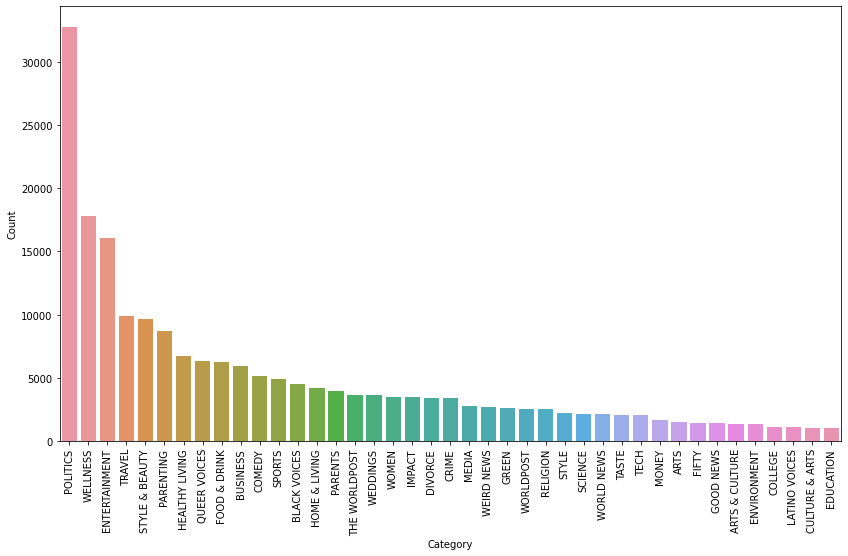

In [ ]:
plt.figure(figsize=(14,8))
count = df.category.value_counts()
sns.barplot(x=count.index, y=count)
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=90);


### **LDA**


In [ ]:
from sklearn.decomposition import LatentDirichletAllocation
import numpy as np

In [ ]:
corpus = list(df['headline'])
print(len(corpus))

200853


In [ ]:
def remove_sw(t):
  tokens = t.strip().split(' ')
  tokens = [token for token in tokens if token not in palabras_vacias]
  tout = ' '.join(tokens).strip()
  return tout
def clean_text(t):
  t = str(t)
  t = re.sub(r'\d+',' ',t)
  t = re.sub(r'[^\w\n]',' ',t)
  t = re.sub(r'\s\s+',' ',t)
  t = t.lower()
  t = t.strip()
  return t
from wordcloud import WordCloud
def crear_nubes(col_cluster):
  gc = 2
  gr = int(nc/gc)
  wcwidth  = 1600
  wcheight = 800
  fig = plt.figure(figsize = (25,60))
  fig.suptitle('Análisis de clusters con {}'.format(col_cluster), fontsize=14)
  for i in range(nc):
    dfs = df[df[col_cluster] == i]['headline']
    texto = ' '.join(map(str,dfs.tolist()))
    wc = WordCloud(width=wcwidth, height=wcheight).generate(texto)
    ax = fig.add_subplot(gr,gc,i+1)
    ax.imshow(wc,interpolation='bilinear')
    ax.axis('off')
    ax.set_title('{} cluster # {}'.format(col_cluster,str(i+1)))
    ax.title.set_size(20)
  return fig

In [ ]:
corpus = [clean_text(t) for t in corpus]
corpus = [remove_sw(t) for t in corpus]
#corpus

In [ ]:
vectorizer = TfidfVectorizer(stop_words='english',sublinear_tf=True)
X = vectorizer.fit_transform(corpus)
vocab = vectorizer.get_feature_names_out()
print(X.shape)

(200853, 54288)


In [ ]:
nc = 20
df['texto'] = corpus

## **LDA**

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation
import numpy as np

In [ ]:
lda_model = LatentDirichletAllocation(n_components=nc,random_state=10)
lda = lda_model.fit_transform(X)

In [ ]:
tp_palabra = {}
n_top_pal = 15
for topico, comp in enumerate(lda_model.components_):
  pal_ind = np.argsort(comp)[::-1][:n_top_pal]
  tp_palabra[topico] = [vocab[i] for i in pal_ind]

In [ ]:
for topico,palabras in tp_palabra.items():
  print("Tópico {} : {}".format(topico,' ,'.join(palabras)))

Tópico 0 : photos ,super ,bowl ,happiness ,pope ,vintage ,healthy ,hotels ,weekly ,lady ,francis ,finds ,ebay ,seth ,animal
Tópico 1 : health ,study ,cancer ,care ,sleep ,heart ,risk ,women ,change ,mental ,tweets ,brain ,kids ,parents ,week
Tópico 2 : trump ,meditation ,questions ,tax ,daily ,ask ,noah ,donald ,immigration ,myths ,trevor ,plan ,obama ,los ,letting
Tópico 3 : trump ,saudi ,killed ,dead ,video ,taught ,dreams ,car ,walking ,game ,season ,mcdonald ,yemen ,police ,revolution
Tópico 4 : north ,korea ,photos ,red ,carpet ,middle ,workout ,secrets ,east ,friends ,south ,kitchen ,carolina ,video ,mommy
Tópico 5 : trump ,donald ,clinton ,hillary ,gop ,paul ,democrats ,house ,russia ,president ,election ,ryan ,obama ,obamacare ,senate
Tópico 6 : huffpost ,need ,divorce ,rise ,married ,mistakes ,couples ,weddings ,wall ,financial ,working ,words ,world ,make ,job
Tópico 7 : court ,trump ,supreme ,obama ,gop ,rights ,cruz ,marriage ,ted ,republican ,donald ,presidential ,rubio ,g

In [ ]:
topicos = []
for n in range(lda.shape[0]):
  topicos.append(lda[n].argmax())
df['lda'] = topicos

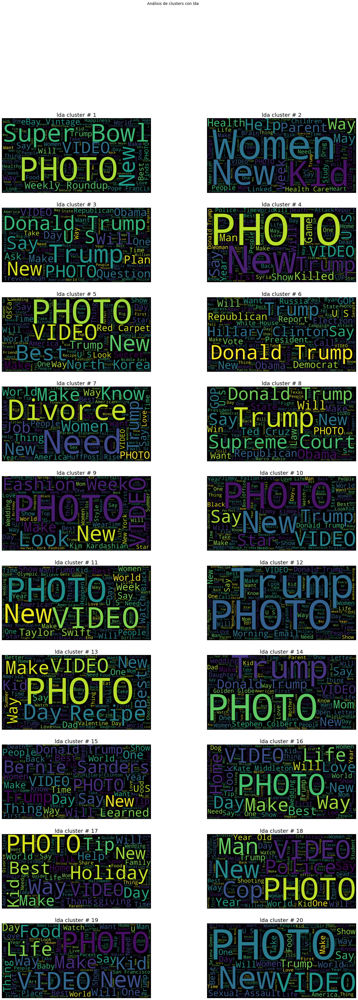

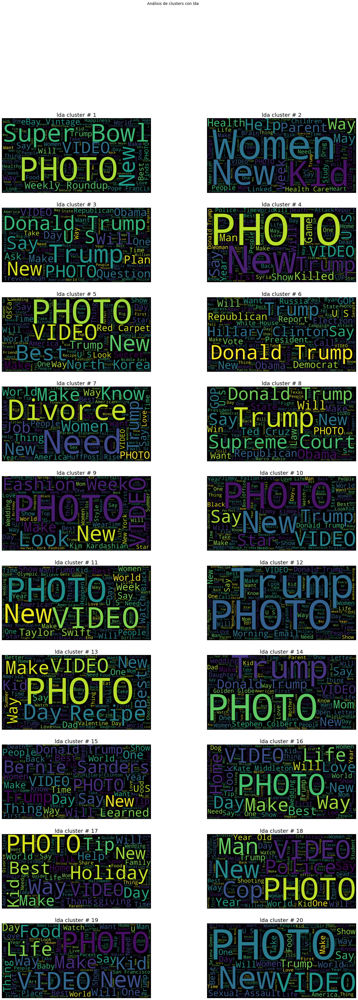

In [ ]:
crear_nubes('lda')

### **NMF**

In [ ]:
from sklearn.decomposition import NMF

In [ ]:
nmf_model = NMF(n_components=nc,random_state=10,max_iter=400)
nmf = nmf_model.fit_transform(X)

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


In [ ]:
tp_palabras = {}
for topico, comp in enumerate(nmf_model.components_):
  pal_ind = np.argsort(comp)[::-1][:n_top_pal]
  tp_palabras[topico] = [vocab[i] for i in pal_ind]

In [ ]:
topicos = []
for n in range(nmf.shape[0]):
  topicos.append(nmf[n].argmax())
df['nmf'] = topicos

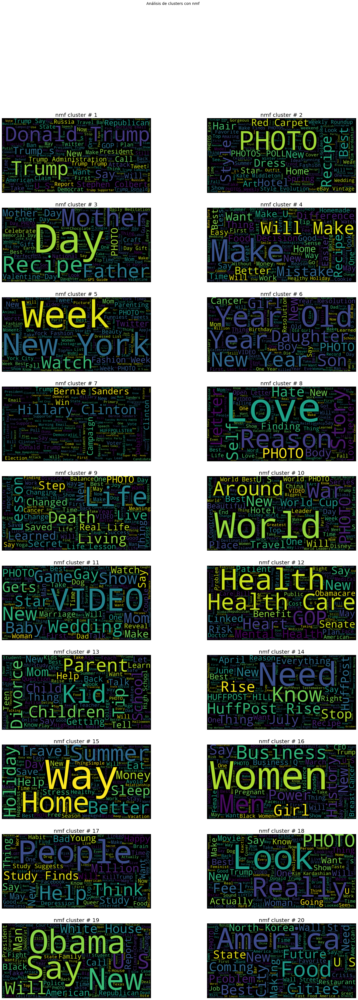

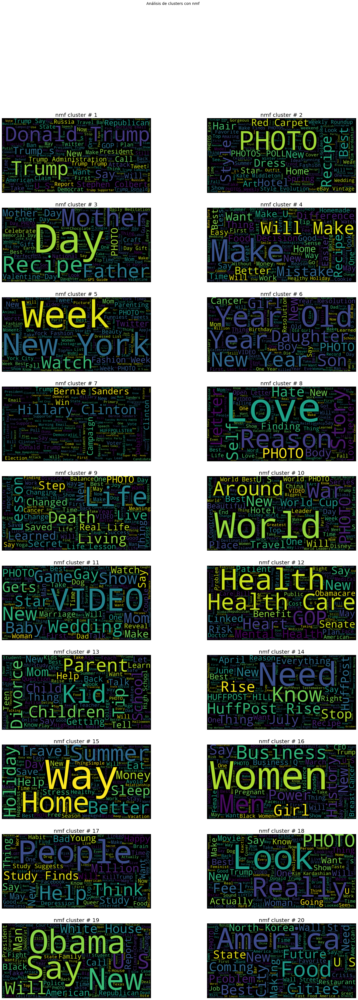

In [ ]:
crear_nubes('nmf')

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
def clean_text(t):
  t = str(t)
  t = re.sub(r'\d+',' ',t)
  t = re.sub(r'[^\w\n]',' ',t)
  t = re.sub(r'\s\s+',' ',t)
  t = t.lower()
  t = t.strip()
  return t

In [ ]:
cv = CountVectorizer(stop_words='english')
tv = TfidfVectorizer(stop_words='english')
lda = LatentDirichletAllocation(n_components=10, random_state=42)
nmf = NMF(n_components=10, random_state=42)


In [ ]:
lda_scores = []
nmf_scores = []
categories = df['category'].unique().tolist()

In [ ]:
import numpy as np
from scipy import spatial
from sklearn.metrics import pairwise

In [ ]:
cv = CountVectorizer(stop_words='english')
tv = TfidfVectorizer(stop_words='english')
lda = LatentDirichletAllocation(n_components=5)
nmf = NMF(n_components=5)
categories = df['category'].unique().tolist()

In [ ]:
cv_vectors = cv.fit_transform(df['category'])
tv_vectors = tv.fit_transform(df['category'])
lda.fit(cv_vectors)
nmf.fit(tv_vectors)

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


NMF(n_components=5)

In [ ]:
lda_scores = []
nmf_scores = []
for category in set(df['category']):
    df_categoria = df[df['category'] == category]
    lda_category_scores = []
    nmf_category_scores = []
    for i in range(len(df_categoria)):
        cv_vector = cv.transform([df_categoria.iloc[i]['headline']])
        tv_vector = tv.transform([df_categoria.iloc[i]['headline']])
        lda_similarity = np.max(cv_vector.dot(lda.components_.T))
        nmf_similarity = np.max(tv_vector.dot(nmf.components_.T))
        lda_category_scores.append(lda_similarity)
        nmf_category_scores.append(nmf_similarity)
    lda_scores.append((category, np.mean(lda_category_scores)))
    nmf_scores.append((category, np.mean(nmf_category_scores)))  

for i in range(len(lda_scores)):
    category = lda_scores[i][0]
    lda_score = lda_scores[i][1]
    nmf_score = nmf_scores[i][1]
    print(f"Categoría: {category}")
    print(f"Puntaje promedio LDA: {lda_score:.2f}")
    print(f"Puntaje promedio NMF: {nmf_score:.2f}")

Categoría: POLITICS
Puntaje promedio LDA: 515.63
Puntaje promedio NMF: 0.12
Categoría: CULTURE & ARTS
Puntaje promedio LDA: 638.56
Puntaje promedio NMF: 0.10
Categoría: WORLD NEWS
Puntaje promedio LDA: 450.16
Puntaje promedio NMF: 0.07
Categoría: BLACK VOICES
Puntaje promedio LDA: 1497.93
Puntaje promedio NMF: 0.17
Categoría: STYLE & BEAUTY
Puntaje promedio LDA: 1797.14
Puntaje promedio NMF: 0.98
Categoría: WELLNESS
Puntaje promedio LDA: 622.24
Puntaje promedio NMF: 0.06
Categoría: QUEER VOICES
Puntaje promedio LDA: 953.02
Puntaje promedio NMF: 0.10
Categoría: TASTE
Puntaje promedio LDA: 854.90
Puntaje promedio NMF: 0.04
Categoría: THE WORLDPOST
Puntaje promedio LDA: 390.50
Puntaje promedio NMF: 0.06
Categoría: ENTERTAINMENT
Puntaje promedio LDA: 368.70
Puntaje promedio NMF: 0.06
Categoría: FIFTY
Puntaje promedio LDA: 548.84
Puntaje promedio NMF: 0.09
Categoría: ARTS
Puntaje promedio LDA: 502.44
Puntaje promedio NMF: 0.07
Categoría: COMEDY
Puntaje promedio LDA: 448.16
Puntaje promedio 